In [1]:
import numpy as np
from PIL import Image
import cv2

import matplotlib.pyplot as plt

from image_processing_utils import *

In [2]:
files = '../data/cathedral/d001.jpg ../data/cathedral/d002.jpg ../data/cathedral/d003.jpg ../data/cathedral/d004.jpg ../data/cathedral/d005.jpg ../data/cathedral/result.png'.split(' ')
images = [cv2.imread(x, 1) for x in files]

images, target = images[:-1], images[-1]

In [3]:
def imshow(a):
    a = a.clip(0, 255).astype('uint8')
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(a))

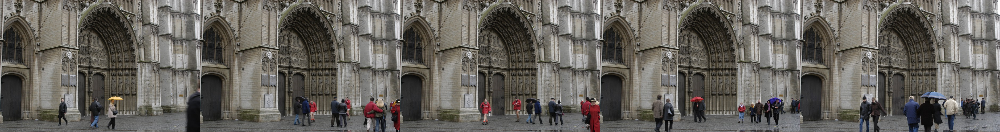

In [4]:
imshow(np.concatenate(images[:5], 1))

In [5]:
def compute_pixel(mean, a, b, c, d, e):
    stacked = np.row_stack((a,b,c,d,e))
    a_diff = np.sum(np.abs(mean-a))
    
    b_diff = np.sum(np.abs(mean-b))
    c_diff = np.sum(np.abs(mean-c))
    d_diff = np.sum(np.abs(mean-d))
    e_diff = np.sum(np.abs(mean-e))
    values_sorted = [a_diff, b_diff, c_diff, d_diff, e_diff]
    min_value = min(values_sorted)
    min_index = values_sorted.index(min_value)
    return stacked[min_index]

In [6]:
test = np.zeros(shape=(500,752, 3))
threshold = 15

m1 = np.mean(images[0], axis=(0, 1))
m2 = np.mean(images[1], axis=(0, 1))
m3 = np.mean(images[2], axis=(0, 1))
m4 = np.mean(images[3], axis=(0, 1))
m5 = np.mean(images[4], axis=(0, 1))

images_mean_color = np.mean(np.row_stack((m1, m2, m3, m4, m5)), axis=0)

In [7]:
images_mean_color

array([ 93.47671968,  99.07958191, 102.41449521])

In [8]:
for y in range(500):
    for x in range(752):
        a, b, c, d, e = images[0][y][x].astype(int), images[1][y][x].astype(int), images[2][y][x].astype(int), images[3][y][x].astype(int), images[4][y][x].astype(int)
        if np.all(np.abs(a-b)<threshold) and np.all(np.abs(b-c)<threshold) and np.all(np.abs(c-d)<threshold) and np.all(np.abs(d-e)<threshold):
            test[y][x] = images[0][y][x]
        else:
            test[y][x] = compute_pixel(images_mean_color, a,b,c,d,e)

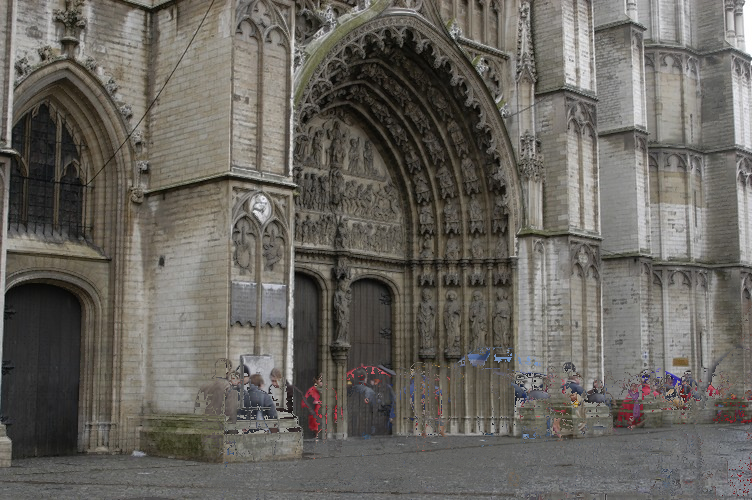

In [9]:
imshow(test)

In [26]:
row_392 = test[392] # much red

In [47]:
row_200 = test[200] # normal proper row to compare
row_357 = test[357] # much blue

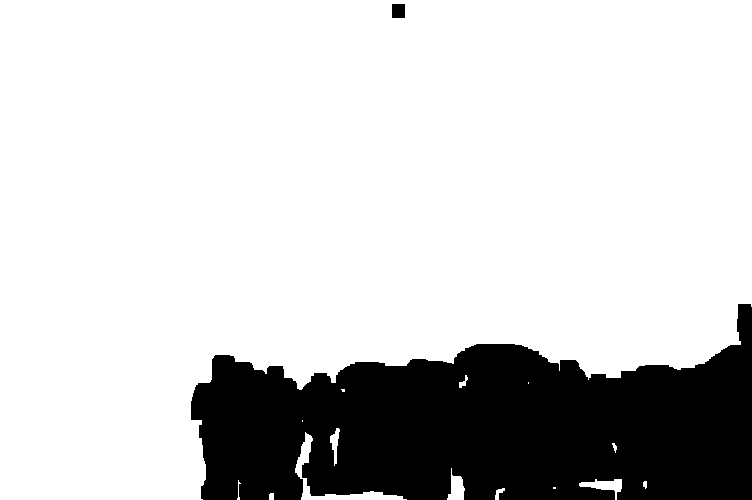

In [10]:
no_noise_map = get_no_noise_map(images) * 255
struct = np.ones((3,3), np.uint8)

eroded = cv2.dilate(no_noise_map/255, struct, iterations=3)
img_closed = cv2.erode(eroded, struct, iterations=6) * 255
# imshow(img_median)
imshow(img_closed)

In [62]:
def select_min_max_pixel(pixels: np.array) -> np.array:
    differences = [max(pixel)-min(pixel) for pixel in pixels]
    inx_min = differences.index(min(differences))
    return pixels[inx_min]

In [70]:
test_min_max = test.copy()
for y in range(500):
    for x in range(752):
        if img_closed[y][x] == 0.0:
            a = select_min_max_pixel(get_possible_pixels(images, y, x))
            # print(test_min_max[y][x], a)
            test_min_max[y][x] = a

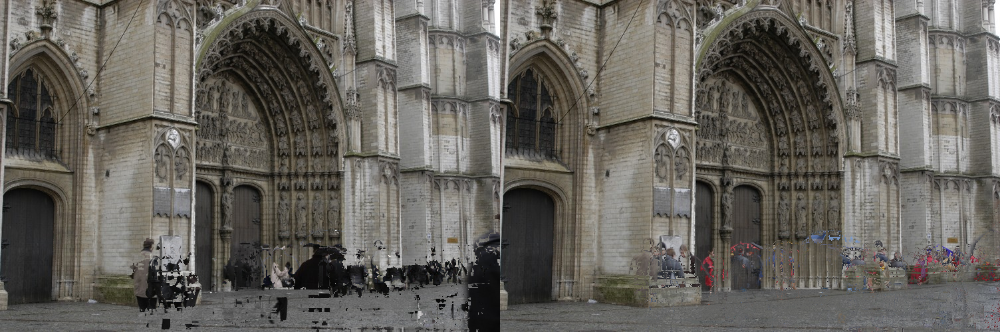

In [71]:
imshow(np.concatenate([test_min_max, test], 1))

In [11]:
from pixels_info_utils import *

In [17]:
pixels, mean, median = pixel_info(images, 380, 675, test, True)
get_proper_pixels_from_result(target, 365, 675)

Generated has value:  [144.  42.  53.]
Image 0 [186 186 186]
Image 1 [159 176 189]
Image 2 [186 185 187]
Image 3 [144  42  53]
Image 4 [187 187 187]
Mean: (B,G,R)  [172.4 155.2 160.4]
Median: (B,G,R [186. 185. 187.]


array([189, 186, 189], dtype=uint8)

In [13]:
for y in range(500):
    for x in range(752):
        if img_closed[y][x] == 0.0:
            print(f"Pos: ({x},{y})")
            pixel_info(images, y, x, test, True)
            print("Target pixel value: ", get_proper_pixels_from_result(target, y-15, x))

Pos: (392,4)
Generated has value:  [ 95.  97. 105.]
Image 0 [ 95  97 105]
Image 1 [90 94 99]
Image 2 [ 94  97 105]
Image 3 [ 94 100 105]
Image 4 [ 98 102 107]
Mean: (B,G,R)  [ 94.2  98.  104.2]
Median: (B,G,R [ 94.  97. 105.]
Target pixel value:  [106 113 115]
Pos: (393,4)
Generated has value:  [77. 80. 88.]
Image 0 [77 80 88]
Image 1 [72 76 81]
Image 2 [76 79 87]
Image 3 [71 77 82]
Image 4 [83 87 92]
Mean: (B,G,R)  [75.8 79.8 86. ]
Median: (B,G,R [76. 79. 87.]
Target pixel value:  [115 121 123]
Pos: (394,4)
Generated has value:  [53. 56. 64.]
Image 0 [53 56 64]
Image 1 [47 50 58]
Image 2 [53 56 64]
Image 3 [52 58 65]
Image 4 [38 44 51]
Mean: (B,G,R)  [48.6 52.8 60.4]
Median: (B,G,R [52. 56. 64.]
Target pixel value:  [115 117 123]
Pos: (395,4)
Generated has value:  [43. 49. 56.]
Image 0 [43 49 56]
Image 1 [43 49 56]
Image 2 [41 47 54]
Image 3 [44 50 57]
Image 4 [38 44 51]
Mean: (B,G,R)  [41.8 47.8 54.8]
Median: (B,G,R [43. 49. 56.]
Target pixel value:  [115 117 123]
Pos: (396,4)
Genera

KeyboardInterrupt: 

In [18]:
medianed_test = test.copy()
for y in range(500):
    for x in range(752):
        if img_closed[y][x] == 0.0:
            pixels = get_available_pixels(medianed_test, images, y, x, _print=False)
            medianed_test[y][x] = get_2d_channel_median(pixels)

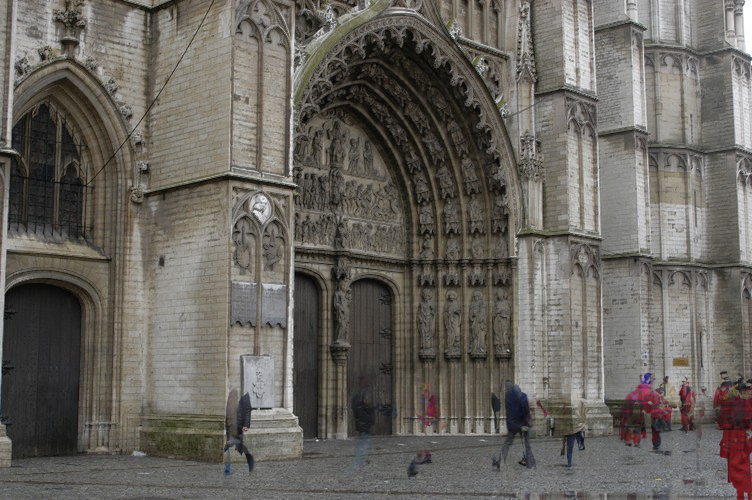

In [19]:
imshow(medianed_test)

In [35]:
y=411
x=570
pixels, mean, median = pixel_info(images, y, x, medianed_test, True)
get_proper_pixels_from_result(target, y-15, x)

Generated has value:  [51. 58. 57.]
Image 0 [42 58 57]
Image 1 [41 60 57]
Image 2 [51 39 33]
Image 3 [65 50 41]
Image 4 [159 171 177]
Mean: (B,G,R)  [71.6 75.6 73. ]
Median: (B,G,R [51. 58. 57.]


array([41, 60, 57], dtype=uint8)

In [27]:
get_2d_channel_average(pixels[:4])

array([97.5 , 94.  , 94.25])

# Test by taking from median image pixels, select two pixels which are closest two each other and take their mean #

In [55]:
def average_closest_pixels(pixels):
    closest = np.inf
    m = np.zeros(shape=(3,))
    for i in range(4):
        for j in range(i+1, 5):
            a = np.sum(np.abs(pixels[i].astype(int)-pixels[j].astype(int)))
            if a < closest:
                closest = a
                m = np.mean(np.row_stack((pixels[i], pixels[j])), axis=0)
    return m.astype(np.uint8)

    


In [48]:
b = get_available_pixels(test, images, 411, 750)

In [49]:
average_closest_pixels(b)

array([ 41. ,  33.5, 126. ])

In [50]:
b

array([[ 16,  16,  16],
       [ 45,  37, 137],
       [ 37,  30, 115],
       [ 16,  12,  61],
       [ 60,  65,  68]], dtype=uint8)

In [51]:
get_proper_pixels_from_result(target, 411-15, 750)

array([49, 56, 57], dtype=uint8)

In [53]:
avg_2_closest_test = medianed_test.copy()
for y in range(500):
    for x in range(752):
        if img_closed[y][x] == 0.0:
            pixels = get_available_pixels(medianed_test, images, y, x, _print=False)
            medianed_test[y][x] = average_closest_pixels(pixels)

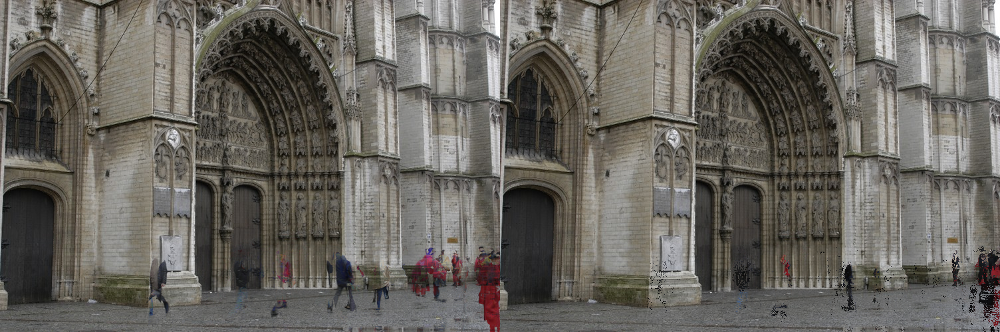

In [57]:
imshow(np.concatenate([avg_2_closest_test, medianed_test],1))

In [56]:
np.array_equal(avg_2_closest_test, medianed_test)

False

# Cleaning up obtained image

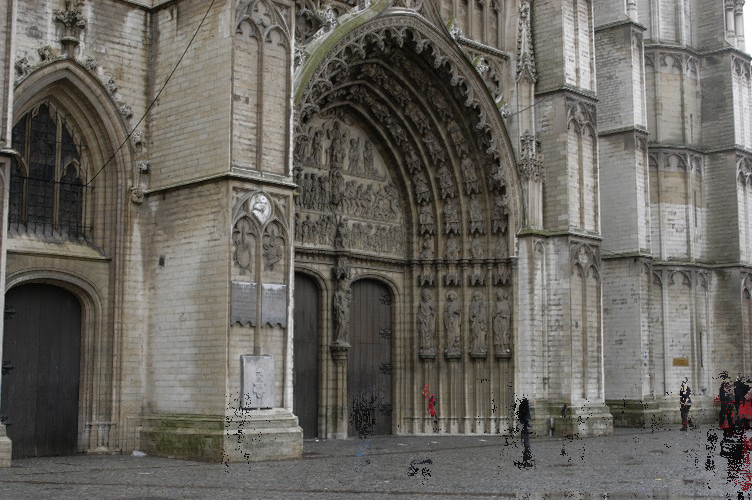

In [58]:
imshow(medianed_test)

The idea is to iterate over rows, compute mean color for each row, and for each pixel assign color which is the closest one.

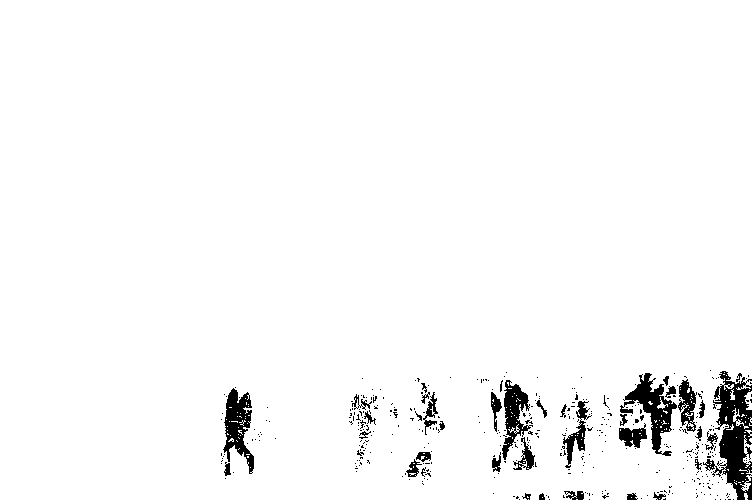

In [173]:
noise_map = get_no_noise_map(np.array([avg_2_closest_test, medianed_test])) * 255
struct = np.ones((1,1), np.uint8)

eroded = cv2.dilate(noise_map/255, struct, iterations=3)
new_diff = cv2.erode(eroded, struct, iterations=6) * 255
# imshow(img_median)
imshow(new_diff)

In [78]:
def compute_closest_to_mean_row(row_mean: np.array, pixels: np.array) -> np.array:
    m = np.inf
    w = pixels[0]
    for pixel in pixels:
        diff = np.sum(np.abs(row_mean.astype(int)-pixel.astype(int)))
        if diff<m:
            m = diff
            w = pixel
    return w.astype(np.uint8)

In [134]:
def compute_closest_to_mean(row_mean: np.array, column_mean: np.array,pixels: np.array) -> np.array:
    m = np.inf
    w = pixels[0]
    for pixel in pixels:
        diff = np.sum(np.abs(row_mean.astype(int)-pixel.astype(int)))+np.sum(np.abs(column_mean.astype(int)-pixel.astype(int)))
        if diff<m:
            m = diff
            w = pixel
    return w.astype(np.uint8)

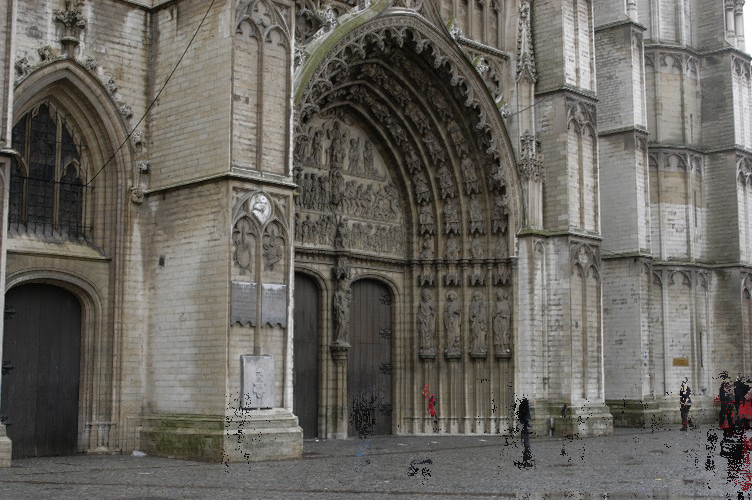

In [86]:
imshow(medianed_test)

In [158]:
def detect_outlier(pixel) -> bool:
    pixel = np.sort(pixel)[::-1]
    if pixel[0] > pixel[1] + 30:
        return True
    return False

Selet all pixels which has all channels <55 or when any channel is greater than other by 30 (outliers)

row 415
x 525

In [174]:
output = medianed_test.copy()
for y in range(500):
    for x in range(752):
        if new_diff[y][x] == 0.0 and (np.all(medianed_test[y][x]<65.0) or detect_outlier(medianed_test[y][x])):
            row_mean = np.mean(medianed_test[y], axis=0)
            column_mean = np.mean(medianed_test[:, x, :], axis=0)
            output[y][x] = compute_closest_to_mean(row_mean, column_mean, get_available_pixels(medianed_test, images, y, x))            

In [136]:
np.array_equal(output, medianed_test)

False

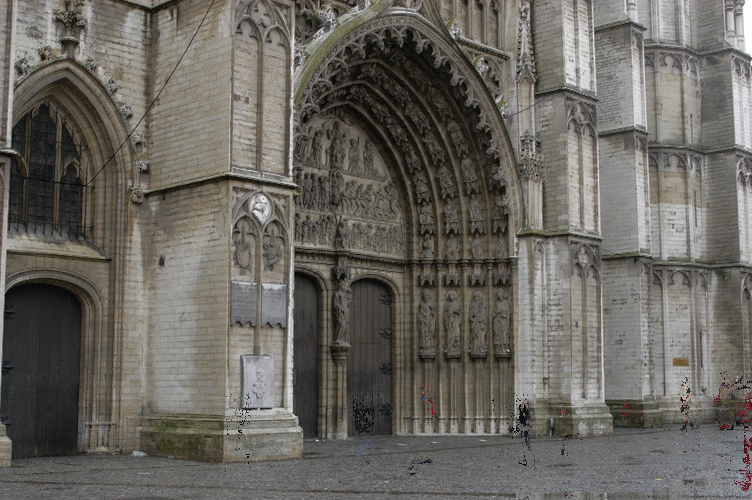

In [175]:
imshow(output)

In [161]:
x = 750
y = 408
print("Considered from mask: ", new_diff[y][x])

pixels, mean, median = pixel_info(images, y, x, output, True)
print(get_proper_pixels_from_result(target, y-15, x))
print("Row mean: ", np.mean(medianed_test[y], axis=0))
print("Column mean: ", np.mean(medianed_test[:, x, :], axis=0))
print(compute_closest_to_mean(np.mean(medianed_test[y], axis=0), np.mean(medianed_test[:, x, :], axis=0), pixels))


Considered from mask:  255.0
Generated has value:  [ 39.  32. 121.]
Image 0 [22 20 20]
Image 1 [ 38  34 129]
Image 2 [ 41  31 114]
Image 3 [10  8 50]
Image 4 [109 114 117]
Mean: (B,G,R)  [44.  41.4 86. ]
Median: (B,G,R [ 38.  31. 114.]
[ 98 105 106]
Row mean:  [74.50132979 80.81515957 85.35106383]
Column mean:  [138.516 137.988 146.28 ]
[109 114 117]
